![](https://api.brandy.run/core/core-logo-wide)

# API

Una API (`Application Program Interface`), como dice su nombre, es una interfaz, un intermedio en la comunicación entre diferentes aplicaciones. En practica, una API no es más que un programa que recibe una petición, le interpreta, ejecuta las acciones necesarias y devuelve una respuesta.

## REST API

Aunque la definición de API sea bastante amplia, cuando hablamos sobre APIs, en general nos estamos referiendo a APIs del tipo REST (`Representational state transfer`), que funcionan de manera muy parecida a una página web.

Las api REST para eso utilizan el protocolo `http`, que es el mismo que utilizamos en nuestro cotidiano en internet, al visitar una página web, etc. Pero diferentemente de una página Web, la API no nos devuelve el codigo para que nuestro navegador pinte una página web, sino que nos disponibilizan datos y servicios, lo que hace que el desarollo de nuevas aplicaciones es más rápido y no necesita empezar siempre desde el cero.

## Requests

Antes de nada, para podermos comunicarnos con una API, necesitamos de una herramienta en python que sea capaz de enviar peticiones http. Para eso usaremos el modulo `requests`.

In [1]:
import requests

## HTTP request methods

Cuando hablamos de las peticiones (requests) en http, tenemos diferentes métodos en que se pueden ejecutar esos requests. Los métodos más frecuentes son `POST, GET, PUT, DELETE`, correspondiendo a las 4 operaciones CRUD respectivamente.

Cuando visitamos una página Web, nuestro navegador está haciendo una petición del tipo GET a la dirección de la página. Con una API es parecido y la API también tiene una URL.

In [2]:
url="https://thatcopy.pw/catapi/rest/"
requests.get(url) 

<Response [200]>

## Response Status Code

Cada vez hagamos una petición HTTP, recibiremos un codigo numérico como la respuesta. Cada uno de esos codigos tiene un significado específico. Muy probablemente te suenan algunos de esos, como el codigo `404 Not Found.`.

Podemos conferir en muchos listados el significado de los codigos, por ejemplo en [http.cat](https://http.cat/)

In [3]:
res = requests.get(url) 

In [4]:
res.text

'{"id":15,"url":"https://thatcopy.github.io/catAPI/imgs/jpg/457ad37.jpg","webpurl":"https://thatcopy.github.io/catAPI/imgs/webp/457ad37.webp","x":49.23,"y":46.45}'

In [5]:
res.json()

{'id': 15,
 'url': 'https://thatcopy.github.io/catAPI/imgs/jpg/457ad37.jpg',
 'webpurl': 'https://thatcopy.github.io/catAPI/imgs/webp/457ad37.webp',
 'x': 49.23,
 'y': 46.45}

De manera general y preferiblemente, las API devolveran datos en el formato JSON.

In [6]:
cat = requests.get(url).json()
cat

{'id': 12,
 'url': 'https://thatcopy.github.io/catAPI/imgs/jpg/32b998f.jpg',
 'webpurl': 'https://thatcopy.github.io/catAPI/imgs/webp/32b998f.webp',
 'x': 52.8,
 'y': 40.66}

In [7]:
cat_url = requests.get(cat["url"])

In [8]:
#with open("cat.jpg", "wb") as file:
#    file.write(cat_url.content)

In [9]:
from PIL import Image
from io import BytesIO

In [10]:
im_bytes = requests.get(cat["url"]).content

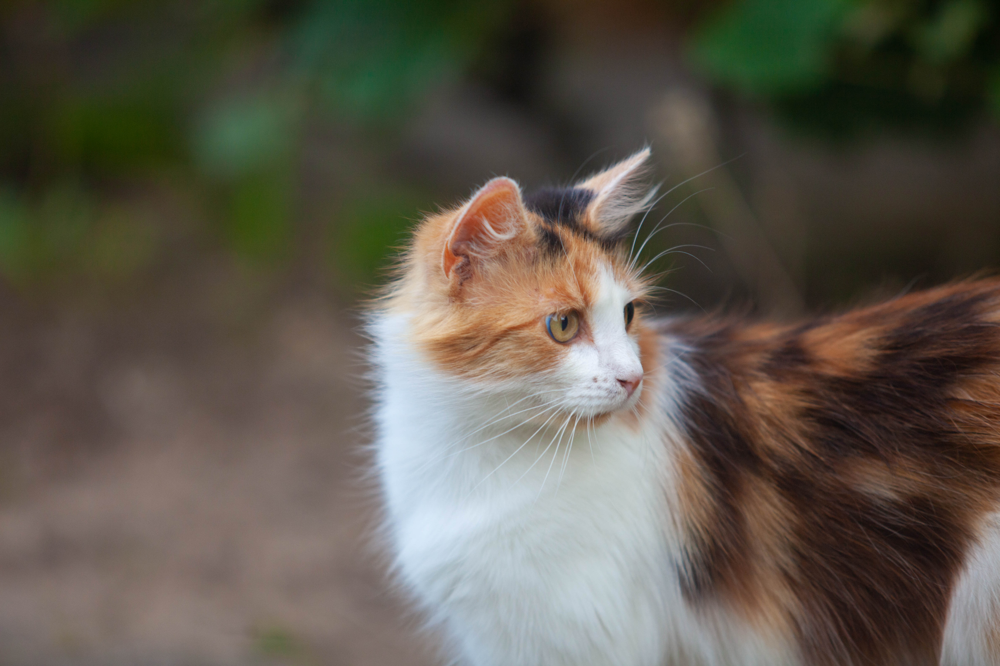

In [11]:
Image.open(BytesIO(im_bytes))

## Endpoints and query parameters

No basta, entretanto, que tengamos una única URL para hacer las peticiones de una API. Tenemos que ser capaces de enviar información y recibir una información particular, no genérica. Para eso usaremos de los diferentes `endpoints` y `query parameters` de la API. 

El endpoint es la parte final de la URL, localizada despues del `/`. Los enpoints pueden ser palabras específicas definidas en la API, como diferentes operaciones a las cuales podemos aceder, o también pueden ser parámetros variables que pasemos con la request.

Los query parameters son parámetros que pasamos de una manera diferente, como pares de `key:value`. Usando la libreria requests los pasamos como un dicionário y la transición a la url se hace por nosotros. Pero los query parameters siempre estaran despued del endpoint, después de `?` y separados por `&`. 

Cuando utilices el navegador en tu día a día, verás muchos endpoints y query strings.

Los endpoints y parámetros de cada API estaran definidos en la documentación de cada api segun ella ha sido programada. Por ejemplo, la api nominatim tiene la siguiente [doc.](https://nominatim.org/release-docs/develop/api/Overview/)

In [12]:
url = "https://nominatim.openstreetmap.org"
endpoint = "/search"
query = {
    "q":"Esteban Terradas, 9 Madrid",
    "format":"json"
}

In [13]:
res = requests.get(url+endpoint, params=query)

In [14]:
res

<Response [200]>

In [15]:
res.json()

[{'place_id': 190109873,
  'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. https://osm.org/copyright',
  'osm_type': 'way',
  'osm_id': 383543202,
  'boundingbox': ['40.4692542', '40.4693736', '-3.6848936', '-3.6846492'],
  'lat': '40.4693139',
  'lon': '-3.6847714',
  'display_name': '9, Calle de Esteban Terradas, Castilla, Chamartín, Madrid, Área metropolitana de Madrid y Corredor del Henares, Comunidad de Madrid, 28036, España',
  'class': 'building',
  'type': 'apartments',
  'importance': 0.42099999999999993}]

In [16]:
from folium import Map, Marker
# https://python-visualization.github.io/folium/

In [17]:
res.json()[0]["lat"]

'40.4693139'

In [18]:
coord = [float(res.json()[0]["lat"]), float(res.json()[0]["lon"])]

In [19]:
m = Map(coord, zoom_start=10)

In [20]:
m

In [21]:
marker = Marker(coord)

In [22]:
m.add_child(marker)

In [23]:
res.json()

[{'place_id': 190109873,
  'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. https://osm.org/copyright',
  'osm_type': 'way',
  'osm_id': 383543202,
  'boundingbox': ['40.4692542', '40.4693736', '-3.6848936', '-3.6846492'],
  'lat': '40.4693139',
  'lon': '-3.6847714',
  'display_name': '9, Calle de Esteban Terradas, Castilla, Chamartín, Madrid, Área metropolitana de Madrid y Corredor del Henares, Comunidad de Madrid, 28036, España',
  'class': 'building',
  'type': 'apartments',
  'importance': 0.42099999999999993}]

In [24]:
busqueda = input("Introduce una direccion: ")

query = {
    "q":busqueda,
    "format":"json"
}
res = requests.get(url+endpoint, params=query)
m = Map()
for place in res.json():
    m.add_child(Marker([place["lat"], place["lon"]], tooltip=place["display_name"]))
    
m

Introduce una direccion: Plaza de Toros


Probemos otro endpoint de la misma api:

In [25]:
endpoint = "reverse"
query = {
    "lat":38.897700900310824,
    "lon":-77.03655279999998,
    "format":"json"
}
url = f"https://nominatim.geocoding.ai/{endpoint}"

In [26]:
requests.get(url, params=query).json()

{'place_id': 161342308,
 'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. https://osm.org/copyright',
 'osm_type': 'way',
 'osm_id': 238241022,
 'lat': '38.897699700000004',
 'lon': '-77.03655315',
 'display_name': 'White House, 1600, Pennsylvania Avenue Northwest, Washington, District of Columbia, 20500, United States',
 'address': {'office': 'White House',
  'house_number': '1600',
  'road': 'Pennsylvania Avenue Northwest',
  'city': 'Washington',
  'state': 'District of Columbia',
  'postcode': '20500',
  'country': 'United States',
  'country_code': 'us'},
 'boundingbox': ['38.8974908', '38.897911', '-77.0368537', '-77.0362519']}

## Resources

Las API son muy utiles, pero no hay una única API a la cual siempre vamos utilizar. Hay una infinitud de ellas y las tendremos que buscar segun nuestra necesidad. Abajo puedes ver algunas compilaciones de APIs:

- [Public APIs](https://github.com/public-apis/public-apis)
- [Awesome APIs](https://github.com/whizkydee/Awesome-APIs)
- [Top 50 Most Popular APIs on RapidAPI (2021)](https://rapidapi.com/blog/most-popular-api/)
- [27 Free & Open APIs](https://blog.hubspot.com/website/free-open-apis)

In [27]:
url = "https://api.github.com"
endpoint = "/users/{username}"

In [28]:
res_user = requests.get(url+endpoint.format(username="rodrigo-rl"))

In [29]:
res_user.json()

{'login': 'rodrigo-rl',
 'id': 101878865,
 'node_id': 'U_kgDOBhKMUQ',
 'avatar_url': 'https://avatars.githubusercontent.com/u/101878865?v=4',
 'gravatar_id': '',
 'url': 'https://api.github.com/users/rodrigo-rl',
 'html_url': 'https://github.com/rodrigo-rl',
 'followers_url': 'https://api.github.com/users/rodrigo-rl/followers',
 'following_url': 'https://api.github.com/users/rodrigo-rl/following{/other_user}',
 'gists_url': 'https://api.github.com/users/rodrigo-rl/gists{/gist_id}',
 'starred_url': 'https://api.github.com/users/rodrigo-rl/starred{/owner}{/repo}',
 'subscriptions_url': 'https://api.github.com/users/rodrigo-rl/subscriptions',
 'organizations_url': 'https://api.github.com/users/rodrigo-rl/orgs',
 'repos_url': 'https://api.github.com/users/rodrigo-rl/repos',
 'events_url': 'https://api.github.com/users/rodrigo-rl/events{/privacy}',
 'received_events_url': 'https://api.github.com/users/rodrigo-rl/received_events',
 'type': 'User',
 'site_admin': False,
 'name': 'Rodrigo Ruiz

In [30]:
repo = res_user.json()["repos_url"]

In [31]:
repo

'https://api.github.com/users/rodrigo-rl/repos'

In [32]:
requests.get(repo).json()

[]

In [33]:
res_user = requests.get(url+endpoint.format(username="Alvaro-Lucas"))

In [34]:
res_user.json()

{'login': 'Alvaro-Lucas',
 'id': 33863370,
 'node_id': 'MDQ6VXNlcjMzODYzMzcw',
 'avatar_url': 'https://avatars.githubusercontent.com/u/33863370?v=4',
 'gravatar_id': '',
 'url': 'https://api.github.com/users/Alvaro-Lucas',
 'html_url': 'https://github.com/Alvaro-Lucas',
 'followers_url': 'https://api.github.com/users/Alvaro-Lucas/followers',
 'following_url': 'https://api.github.com/users/Alvaro-Lucas/following{/other_user}',
 'gists_url': 'https://api.github.com/users/Alvaro-Lucas/gists{/gist_id}',
 'starred_url': 'https://api.github.com/users/Alvaro-Lucas/starred{/owner}{/repo}',
 'subscriptions_url': 'https://api.github.com/users/Alvaro-Lucas/subscriptions',
 'organizations_url': 'https://api.github.com/users/Alvaro-Lucas/orgs',
 'repos_url': 'https://api.github.com/users/Alvaro-Lucas/repos',
 'events_url': 'https://api.github.com/users/Alvaro-Lucas/events{/privacy}',
 'received_events_url': 'https://api.github.com/users/Alvaro-Lucas/received_events',
 'type': 'User',
 'site_admin':

In [35]:
repo = res_user.json()["repos_url"]

In [36]:
repo

'https://api.github.com/users/Alvaro-Lucas/repos'

In [37]:
len(requests.get(repo).json())

6

In [38]:
from dotenv import load_dotenv
import os
load_dotenv()

True

In [39]:
token = os.getenv("TOKEN")

In [40]:
token[-5:]

'Ztkc4'

In [41]:
endpoint = "/user/repos"
header = {
    "Authorization": f"token {token}"
}
res = requests.get(url+endpoint, headers=header)

In [42]:
len([rep["name"] for rep in res.json()])

30

In [43]:
endpoint = "/user/repos"
body = {
    "name":"Creando repos desde la API2",
    "description":"Una prueba",
    "private":True
}

In [44]:
res_create_repo = requests.post(url+endpoint, headers=header, json=body)

In [45]:
res_create_repo

<Response [422]>

In [46]:
res_create_repo.json()

{'message': 'Repository creation failed.',
 'errors': [{'resource': 'Repository',
   'code': 'custom',
   'field': 'name',
   'message': 'name already exists on this account'}],
 'documentation_url': 'https://docs.github.com/rest/reference/repos#create-a-repository-for-the-authenticated-user'}

In [47]:
endpoint="/repos/{owner}/{repo}/issues"
body = {
    "title":"Creando Issues"
}

In [48]:
endpoint

'/repos/{owner}/{repo}/issues'

In [49]:
res_issue = requests.post(url+endpoint.format(owner="Alvaro-Lucas", repo="Creando-repos-desde-la-API2"), headers=header, json=body)

In [50]:
res_issue.json()

{'url': 'https://api.github.com/repos/Alvaro-Lucas/Creando-repos-desde-la-API2/issues/2',
 'repository_url': 'https://api.github.com/repos/Alvaro-Lucas/Creando-repos-desde-la-API2',
 'labels_url': 'https://api.github.com/repos/Alvaro-Lucas/Creando-repos-desde-la-API2/issues/2/labels{/name}',
 'comments_url': 'https://api.github.com/repos/Alvaro-Lucas/Creando-repos-desde-la-API2/issues/2/comments',
 'events_url': 'https://api.github.com/repos/Alvaro-Lucas/Creando-repos-desde-la-API2/issues/2/events',
 'html_url': 'https://github.com/Alvaro-Lucas/Creando-repos-desde-la-API2/issues/2',
 'id': 1233072030,
 'node_id': 'I_kwDOHUc7x85Jfy-e',
 'number': 2,
 'title': 'Creando Issues',
 'user': {'login': 'Alvaro-Lucas',
  'id': 33863370,
  'node_id': 'MDQ6VXNlcjMzODYzMzcw',
  'avatar_url': 'https://avatars.githubusercontent.com/u/33863370?v=4',
  'gravatar_id': '',
  'url': 'https://api.github.com/users/Alvaro-Lucas',
  'html_url': 'https://github.com/Alvaro-Lucas',
  'followers_url': 'https://a

In [51]:
endpoint = "/repos/{owner}/{repo}/issues/{issue_number}"
body = {
    "body":"Cerramos la Issue",
    "state":"closed"
}

In [52]:
res_update_issue = requests.patch(url+endpoint.format(owner="Alvaro-Lucas", repo="Creando-repos-desde-la-API2", issue_number=res_issue.json()["number"]), headers=header, json=body)

In [53]:
res_update_issue

<Response [200]>

In [54]:
res_update_issue.json()

{'url': 'https://api.github.com/repos/Alvaro-Lucas/Creando-repos-desde-la-API2/issues/2',
 'repository_url': 'https://api.github.com/repos/Alvaro-Lucas/Creando-repos-desde-la-API2',
 'labels_url': 'https://api.github.com/repos/Alvaro-Lucas/Creando-repos-desde-la-API2/issues/2/labels{/name}',
 'comments_url': 'https://api.github.com/repos/Alvaro-Lucas/Creando-repos-desde-la-API2/issues/2/comments',
 'events_url': 'https://api.github.com/repos/Alvaro-Lucas/Creando-repos-desde-la-API2/issues/2/events',
 'html_url': 'https://github.com/Alvaro-Lucas/Creando-repos-desde-la-API2/issues/2',
 'id': 1233072030,
 'node_id': 'I_kwDOHUc7x85Jfy-e',
 'number': 2,
 'title': 'Creando Issues',
 'user': {'login': 'Alvaro-Lucas',
  'id': 33863370,
  'node_id': 'MDQ6VXNlcjMzODYzMzcw',
  'avatar_url': 'https://avatars.githubusercontent.com/u/33863370?v=4',
  'gravatar_id': '',
  'url': 'https://api.github.com/users/Alvaro-Lucas',
  'html_url': 'https://github.com/Alvaro-Lucas',
  'followers_url': 'https://a